# Financial Markets Project
Deep Learning and Applied AI at Sapienza Univerisity 2021 

Author: Klaudia Palak and Hossein Hashemi

In [ ]:
#Installation 
!pip install pandas-ta
!pip install yfinance
#Import
import pandas as pd
import math
import matplotlib.pyplot as plt
import random
import os
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import yfinance as yf
import matplotlib.animation as animation
from IPython.display import HTML
#Clear
from IPython.display import clear_output 
clear_output()

## Dataset preparation

### Load data

In [ ]:
dataset = yf.download('AAPL','2012-01-01','2021-06-01')
print (dataset.head())
print (dataset.count())

[*********************100%***********************]  1 of 1 completed
                 Open       High        Low      Close  Adj Close     Volume
Date                                                                        
2012-01-03  14.621429  14.732143  14.607143  14.686786  12.629209  302220800
2012-01-04  14.642857  14.810000  14.617143  14.765714  12.697079  260022000
2012-01-05  14.819643  14.948214  14.738214  14.929643  12.838044  271269600
2012-01-06  14.991786  15.098214  14.972143  15.085714  12.972249  318292800
2012-01-09  15.196429  15.276786  15.048214  15.061786  12.951672  394024400
Open         2367
High         2367
Low          2367
Close        2367
Adj Close    2367
Volume       2367
dtype: int64


In [ ]:
# number of GPUs from cuda
GPU_numbers = torch.cuda.device_count()
print("Available GPUs:", GPU_numbers)
print("GPU {}: {}".format(1, torch.cuda.get_device_name(0)))

Available GPUs: 1
GPU 1: Tesla T4


## Hyperparameters

In [ ]:
#configuration
batch_size = 64 #@param {type:"slider", min:1, max:100, step:1}
learning_rate = 5e-4 #@param {type:"number"}
num_epochs = 20000 #@param {type:"slider", min:1, max:50000, step:1}
epoch_steps = 100 #@param {type:"slider", min:1, max:1000, step:1}
optimizer_betas = (0.9, 0.999)

device = torch.device("cuda:0" if (torch.cuda.is_available() and GPU_numbers > 1) else "cpu")

### Create dataset and dataloader

In [ ]:
class Timedata(Dataset):
    def __init__(self, data_frame, length_seq=2):
        self.data = torch.tensor(data_frame.values)
        self.length_seq = length_seq

    def __len__(self):
        return self.data.shape[0] - self.length_seq + 1

    def __getitem__(self, index):
        return self.data[index: index + self.length_seq].float()

In [ ]:
# create pytorch dataset 
training_columns = ["Open", "High", "Low", "Close", "Adj Close", "Volume"]

data_dimension = len(training_columns)
# sequence length
length_seq = 5

train_data, rest_data = train_test_split(dataset[training_columns], test_size=0.2, shuffle=False)
scaler = MinMaxScaler()
scaler.fit(train_data)
train_data[train_data.columns] = scaler.transform(train_data)
rest_data[rest_data.columns] = scaler.transform(rest_data)

validation_data, test_data = train_test_split(rest_data, test_size=0.5, shuffle=False)

train_dataset = Timedata(train_data, length_seq)
test_dataset = Timedata(test_data, length_seq)
validation_dataset = Timedata(validation_data, length_seq)

# create the dataloader
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size)
validation_dataloader = torch.utils.data.DataLoader(validation_dataset, batch_size=batch_size)
real_data_sample = next(iter(train_dataloader))
print("Real data sample shape:", real_data_sample.shape)

Real data sample shape: torch.Size([64, 5, 6])


## Model definition

In [ ]:
class simple_LSTM(nn.Module):
    def __init__(self, hidden_size):
        super(simple_LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.lstm = nn.LSTM(input_size=data_dimension, hidden_size=hidden_size, num_layers=1, batch_first=True)
        self.linear = nn.Linear(hidden_size, data_dimension)
        self.drop = nn.Dropout(0.2)

    def forward(self, input_sequences):
        input_sequences = self.drop(input_sequences)
        lstm_output, hidden_cell = self.lstm(input_sequences)
        res = self.linear(hidden_cell[0][-1])
        return res

In [ ]:
def model_rmse(model, dataloader, epoch, plot_graph=False, plot_title="Validation Predictions", show_preds=False):
    rmse = 0
    squared_error_list = []
    real_data_list = []
    predicted_data_list = []
    file_title = plot_title.lower().replace(" ", "_")
    for i, sequence_batch in enumerate(dataloader):
        with torch.no_grad():
            real_sequence = sequence_batch
            generator_input_sequence = sequence_batch[:,:-1].to(device)
            real_values = sequence_batch[:,-1:]
            predicted_values = simp_LSTM(generator_input_sequence).to(device) #.cpu()
            real_data_list.append(real_values)
            predicted_data_list.append(predicted_values)
    
    real_data = torch.cat(real_data_list, 0)
    predicted_data = torch.cat(predicted_data_list, 0)
    
    # Unscale data
    df_pred = pd.DataFrame(predicted_data.view(-1,len(training_columns)),columns=training_columns)
    df_pred_unscaled = pd.DataFrame(scaler.inverse_transform(df_pred),columns=training_columns)
    df_real = pd.DataFrame(real_data.view(-1,len(training_columns)),columns=training_columns)
    df_real_unscaled = pd.DataFrame(scaler.inverse_transform(df_real),columns=training_columns)
    
    if plot_graph:
        if not os.path.exists('./Plots_Simple_LSTM/'):
            os.makedirs('./Plots_Simple_LSTM/')
        
        for column in training_columns:
            fig = plt.figure(figsize=(16,8))
            plt.xlabel("Date")
            plt.ylabel(column)
            plt.title(plot_title + f" -{column}-")
            plt.plot(df_real_unscaled[column],label="Real")
            plt.plot(df_pred_unscaled[column],label="Predicted")
            plt.legend()
            if show_preds and column == "Close":
                plt.show()
            fig.savefig(f'./Plots_Simple_LSTM/{file_title}_plt_{column}_e{epoch}.png')
            plt.close(fig)
    rmse_results = {}
    for column in training_columns:
        squared_errors = (df_real_unscaled[column] - df_pred_unscaled[column])**2
        rmse = np.sqrt(squared_errors.mean())
        rmse_results[column] = rmse
    return rmse_results

In [ ]:
simp_LSTM = simple_LSTM(hidden_size=data_dimension*2).to(device)
print(simp_LSTM)

simple_LSTM(
  (lstm): LSTM(6, 12, batch_first=True)
  (linear): Linear(in_features=12, out_features=6, bias=True)
  (drop): Dropout(p=0.2, inplace=False)
)


In [ ]:
criterion = nn.MSELoss()
optimizer = optim.Adam(simp_LSTM.parameters(), lr=learning_rate, betas=optimizer_betas)

## Model training

In [ ]:
if not os.path.exists('./Models_Simple_LSTM/'):
    os.makedirs('./Models_Simple_LSTM/')

greatest_predictor_epoch = None
min_close_rmse = math.inf

evaluation_metrics = {"loss":[], "rmse_values":{}}
for column in training_columns:
        evaluation_metrics["rmse_values"][column] = []

# Training
print("Training is started")
for epoch in range(num_epochs):
    for i, sequence_batch in enumerate(train_dataloader):
            real_sequence = sequence_batch.to(device)
            regressor_input_sequence = sequence_batch[:,:-1].to(device)
            real_value = sequence_batch[:,-1].to(device)

            predicted_values = simp_LSTM(regressor_input_sequence)
            simp_LSTM.zero_grad()
            net_error = criterion(predicted_values, real_value)

            net_error.backward()

            optimizer.step()
    if (epoch+1) % epoch_steps == 0 or epoch+1 == 1:
        rmse_values = model_rmse(simp_LSTM, validation_dataloader, epoch=(epoch+1), plot_graph=True)
        if rmse_values["Close"] < min_close_rmse:
            min_close_rmse = rmse_values["Close"]
            greatest_predictor_epoch = epoch+1
        for column in training_columns:
            evaluation_metrics["rmse_values"][column].append(rmse_values[column])
        evaluation_metrics["loss"].append(net_error.item())
        print('\n[{}/{}]\tLoss: {:.4f}'
                  .format(epoch+1, num_epochs, net_error.item()))
        for col_name, rmse in rmse_values.items():
            print(f"{col_name} RMSE: {rmse:.4f}")
        save_path = os.path.join("./Models_Simple_LSTM/","model_epoch_{}.pt".format(epoch+1))
        torch.save({
            'epoch': epoch+1,
            'regressor_model_state_dict': simp_LSTM.state_dict(),
            'optimizer_regressor_state_dict': optimizer.state_dict(),
            'net_error': net_error,
            }, save_path)

Training is started

[1/20000]	Loss: 0.1448
Open RMSE: 52.8608
High RMSE: 35.9980
Low RMSE: 57.2876
Close RMSE: 45.9200
Adj Close RMSE: 53.9058
Volume RMSE: 126446565.4831

[100/20000]	Loss: 0.0037
Open RMSE: 13.3264
High RMSE: 13.6568
Low RMSE: 12.7504
Close RMSE: 13.4383
Adj Close RMSE: 13.8469
Volume RMSE: 60600144.9748

[200/20000]	Loss: 0.0016
Open RMSE: 8.9286
High RMSE: 9.1696
Low RMSE: 8.8699
Close RMSE: 9.5468
Adj Close RMSE: 9.1713
Volume RMSE: 60981693.7883

[300/20000]	Loss: 0.0012
Open RMSE: 6.2030
High RMSE: 6.2690
Low RMSE: 5.7663
Close RMSE: 6.5114
Adj Close RMSE: 6.2484
Volume RMSE: 61614774.2279

[400/20000]	Loss: 0.0023
Open RMSE: 6.1494
High RMSE: 5.8177
Low RMSE: 5.8241
Close RMSE: 6.1354
Adj Close RMSE: 6.1230
Volume RMSE: 65885038.2774

[500/20000]	Loss: 0.0014
Open RMSE: 6.0896
High RMSE: 5.7893
Low RMSE: 6.0502
Close RMSE: 6.0593
Adj Close RMSE: 6.3819
Volume RMSE: 65049231.9684

[600/20000]	Loss: 0.0035
Open RMSE: 6.0948
High RMSE: 5.8677
Low RMSE: 5.9264
Clos

In [ ]:
# RMSE VALUE during the training

for key, val in evaluation_metrics["rmse_values"].items():
    print(key, ":", val)

Open : [52.86079913998414, 13.326367090548185, 8.928615158054447, 6.202988735480145, 6.149350248842071, 6.089644236631289, 6.094792182178966, 6.061340417294543, 5.701741282932351, 5.5245791025140605, 5.23506821923965, 5.193755388769399, 4.846057125195881, 4.671307831350683, 4.350229306495772, 4.427457967777995, 5.002142049877857, 4.581582843998755, 4.56606759732006, 4.710090955409858, 4.694205892419003, 4.697286988355607, 4.356223021231628, 4.570457873084457, 4.658504112449664, 4.34622703669292, 5.10008776202649, 4.59163743690676, 4.481472933715707, 4.90034151507203, 4.52302455539479, 4.641177362612127, 4.69804008120366, 4.613645962970515, 4.7650023485700785, 4.915924887603416, 4.655724370059505, 4.717127951814225, 4.656510848421952, 4.684861088770332, 4.743399740418516, 4.827361725820629, 4.670829384493237, 4.92843507696329, 4.890060654637967, 4.8659439599149374, 4.776239943651836, 4.822138734554711, 4.694999509330394, 4.8673078371402845, 4.7565290961610245, 4.84450770119726, 4.880781

## Visualization of training results

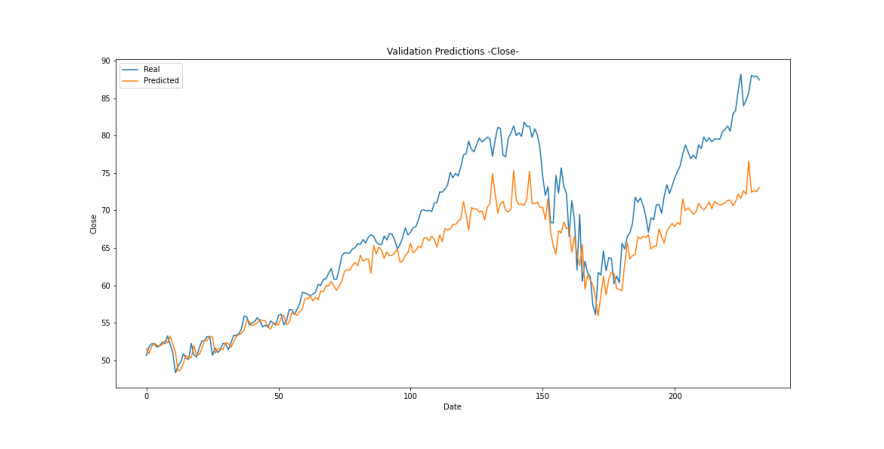

In [ ]:
# Visualization

images = []
for epoch in range(num_epochs):
    if (epoch+1)%epoch_steps == 0 or epoch == 0 or epoch == (num_epochs-1):
        image_path = os.path.join('./Plots_Simple_LSTM/', f'validation_predictions_plt_Close_e{epoch+1}.png')
        image = plt.imread(image_path)
        images.append(image)


fig = plt.figure(figsize=(16,8))
plt.axis("off")

all_images = [[plt.imshow(image, animated=True)] for image in images]
plt.rcParams['animation.embed_limit'] = 2**32
anim = animation.ArtistAnimation(fig, all_images, interval=1000, repeat_delay=1000, blit=True)

HTML(anim.to_jshtml())

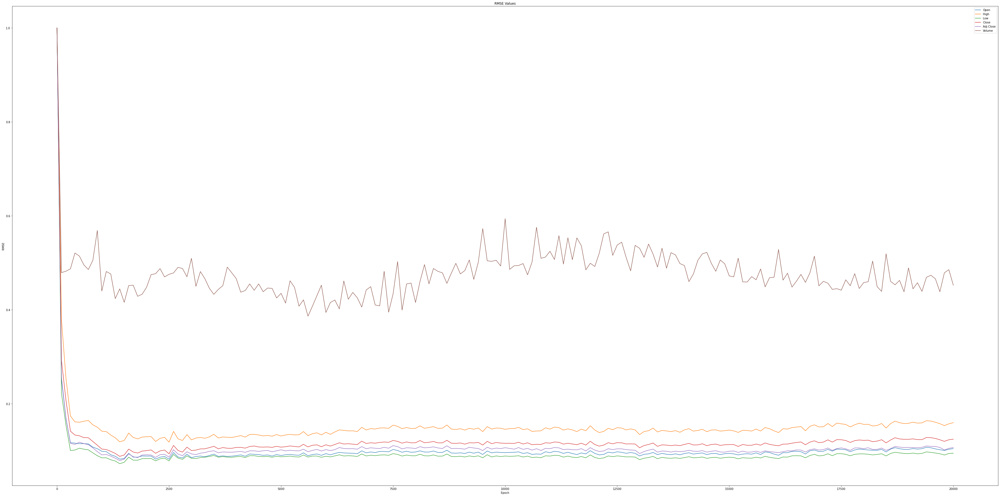

In [ ]:
# Visualization total RMSE

fig = plt.figure(figsize=(64,32))
plt.xlabel("Epoch")
plt.ylabel("RMSE")
plt.title("RMSE Values")
epoch_len = len(evaluation_metrics["rmse_values"][training_columns[0]])
x = [0] + [i for i in range(epoch_steps, epoch_steps*epoch_len, epoch_steps)]
# plt.ylim(0, 5)
for column in training_columns:
    y = evaluation_metrics["rmse_values"][column]
    y /= max(y)
    plt.plot(x, y,label=column)
plt.legend()
fig.savefig(f'./Plots_Simple_LSTM/rmse_Total.png')
plt.show()
plt.close(fig)

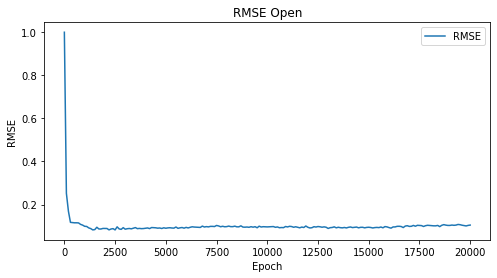

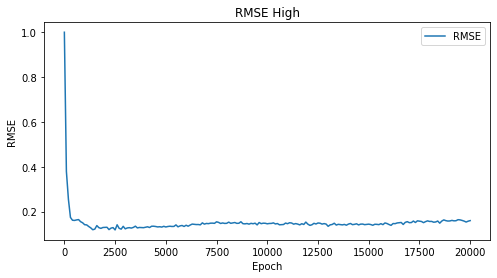

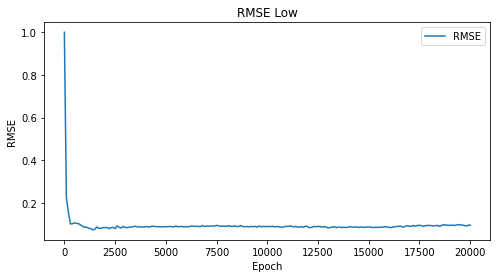

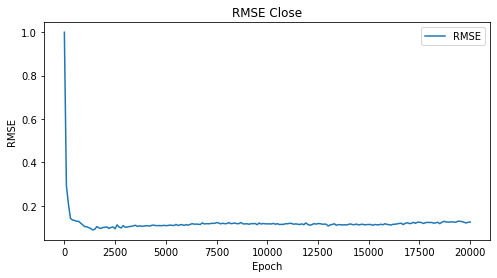

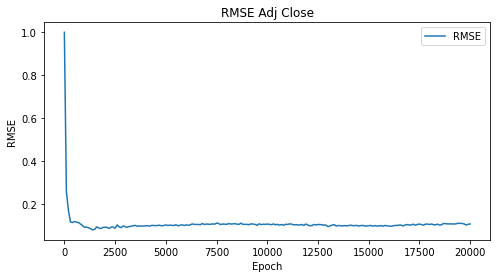

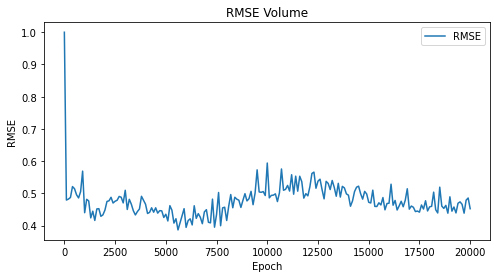

In [ ]:
# Visualization RMSE one by one

for column in training_columns:
    fig = plt.figure(figsize=(8,4))
    plt.xlabel("Epoch")
    plt.ylabel("RMSE")
    plt.title(f"RMSE {column}")
    epoch_len = len(evaluation_metrics["rmse_values"][training_columns[0]])
    x = [0] + [i for i in range(epoch_steps, epoch_steps*epoch_len, epoch_steps)]
    # plt.ylim(0, 5)
    y = evaluation_metrics["rmse_values"][column]
    y /= max(y)
    plt.plot(x, y,label="RMSE")
    plt.legend()
    fig.savefig(f'./Plots_Simple_LSTM/rmse_{column}.png')
    plt.show()
    plt.close(fig)

## Model testing and visualization of testing results

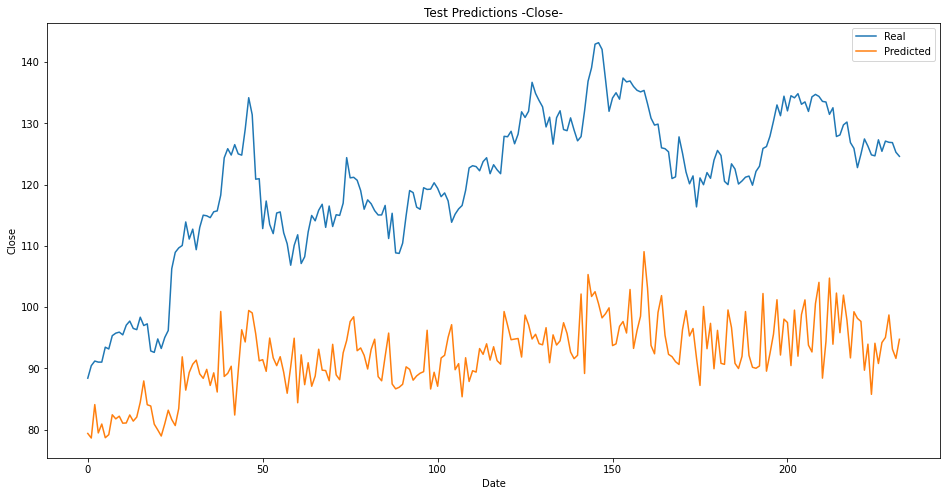

{'Open': 31.95304447639582, 'High': 31.53116318662038, 'Low': 30.283252603314423, 'Close': 29.535977517412018, 'Adj Close': 29.91940363206357, 'Volume': 63455846.117844015}


In [ ]:
# TEST MODEL

checkpoint = torch.load(os.path.join("./Models_Simple_LSTM/","model_epoch_{}.pt".format(greatest_predictor_epoch)))
simp_LSTM.load_state_dict(checkpoint['regressor_model_state_dict'])
rmse_values = model_rmse(simp_LSTM, test_dataloader, epoch=greatest_predictor_epoch, plot_graph=True, plot_title="Test Predictions", show_preds=True)
print(rmse_values)

In [ ]:
greatest_predictor_epoch